<a href="https://www.kaggle.com/code/romikgosai/musicsourceseperationgan?scriptVersionId=212135284" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import tensorflow as tf
import tensorflow_io as tfio
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from IPython.display import Audio
import librosa
import random
import matplotlib.pyplot as plt

2024-12-09 17:36:18.125321: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-09 17:36:18.125445: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-09 17:36:18.264478: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(audio_file):
    audio = tf.io.read_file(audio_file)
    audio , sr= tf.audio.decode_wav(audio)
    audio = tf.squeeze(audio, axis=[-1])
    audio = tf.cast(audio,tf.float32)
    return audio


# def load(audio_file):
#     audio = tfio.audio.AudioIOTensor(audio_file).to_tensor()
#     audio = tf.squeeze(audio, axis=[-1])
#     audio = tf.cast(audio,tf.float32)/32768.0
#     return audio

In [6]:
audio = load('/kaggle/input/music-for-gan/music/train/music_001.wav')
print(audio.shape, type(audio))
Audio(audio.numpy().reshape([2646000]), rate=44100)

(2646000,) <class 'tensorflow.python.framework.ops.EagerTensor'>


In [7]:
bansuri_audio = audio[:1323000]
print(bansuri_audio)
Audio(bansuri_audio.numpy().reshape([1323000]), rate = 44100)

tf.Tensor(
[-3.0517578e-05 -3.0517578e-05 -3.0517578e-05 ... -7.2265625e-02
 -7.2387695e-02 -7.1197510e-02], shape=(1323000,), dtype=float32)


In [8]:
mixture_audio = audio[1323000:]
Audio(mixture_audio.numpy().reshape([1323000]), rate=44100)

(1323000,) <class 'tensorflow.python.framework.ops.EagerTensor'>
(2584, 512)


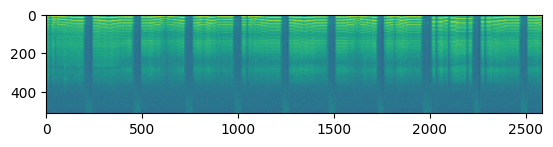

In [9]:
print(bansuri_audio.shape, type(bansuri_audio))
bansuri_spectogram = tfio.audio.spectrogram(bansuri_audio, nfft = 1022, window = 1022, stride=512)
print(bansuri_spectogram.shape)
plt.figure()
plt.imshow(tf.math.log(tf.transpose(bansuri_spectogram)).numpy())

(2646000,)
(2584, 512)


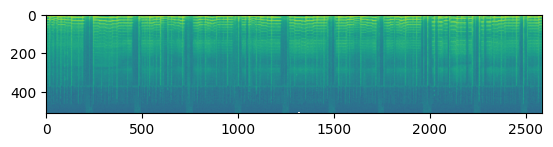

In [10]:
print(audio.shape)
mixture_spectogram = tfio.audio.spectrogram(mixture_audio, nfft = 1022, window = 1022, stride=512)
print(mixture_spectogram.shape)
plt.figure()
plt.imshow(tf.math.log(tf.transpose(mixture_spectogram)).numpy())

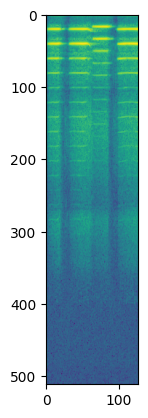

In [11]:
seed1 = random.randint(0,2500)
seed2 = random.randint(0,2500)
bansuri_spectogram = tf.image.stateless_random_crop(bansuri_spectogram, (128,512), (seed1, seed2))
plt.figure()
plt.imshow(tf.math.log(tf.transpose(bansuri_spectogram)).numpy())


In [12]:
def load_train_audio(bansuri_audio_path):
    mixture = load(bansuri_audio_path)
    bansuri = mixture[:1323000]
    mixture = mixture[1323000:]
    bansuri = tfio.audio.spectrogram(bansuri, nfft = 1022, window = 1022, stride=512)
    mixture = tfio.audio.spectrogram(mixture, nfft = 1022, window = 1022, stride=512)
    seed1 = random.randint(0,2500)
    seed2 = random.randint(0,2500)
    bansuri = tf.image.stateless_random_crop(bansuri, (128,512), (seed1, seed2))
    mixture = tf.image.stateless_random_crop(mixture, (128,512), (seed1, seed2))
    bansuri = tf.reshape(bansuri,(128,512,1))
    mixture = tf.reshape(mixture,(128,512,1))
    return mixture, bansuri

In [13]:
BATCH_SIZE = 32

In [14]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/music-for-gan/music/train/*.wav')
train_dataset = train_dataset.map(load_train_audio)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 512, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 512, 1), dtype=tf.float32, name=None))>

In [15]:
validation_dataset = tf.data.Dataset.list_files('/kaggle/input/music-for-gan/music/val/*.wav')
validation_dataset = validation_dataset.map(load_train_audio)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 512, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 512, 1), dtype=tf.float32, name=None))>

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 64, 256, 64)          1664      ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 64, 256, 64)          256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 64, 256, 64)          0         ['batch_normalization[0][0

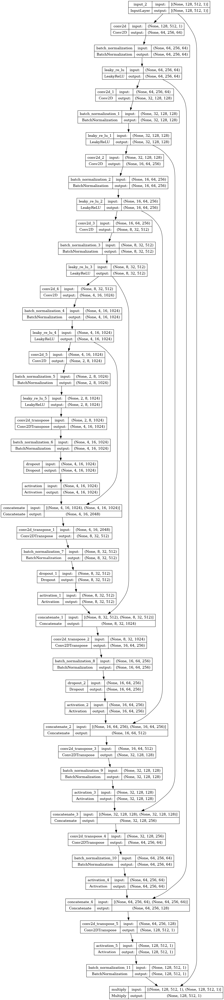

In [16]:
from keras import Input, Model
from keras.layers import Conv2D, Dropout, BatchNormalization, LeakyReLU, Conv2DTranspose, Activation, Concatenate, Multiply
from tensorflow.keras.utils import plot_model

def unet(inputs=Input((128, 512, 1))):
    conv1 = Conv2D(64, 5, strides=2, padding='same')(inputs)
    conv1 = BatchNormalization(axis=-1)(conv1)
    conv1 = LeakyReLU(alpha=0.2)(conv1)

    conv2 = Conv2D(128, 5, strides=2, padding='same')(conv1)
    conv2 = BatchNormalization(axis=-1)(conv2)
    conv2 = LeakyReLU(alpha=0.2)(conv2)

    conv3 = Conv2D(256, 5, strides=2, padding='same')(conv2)
    conv3 = BatchNormalization(axis=-1)(conv3)
    conv3 = LeakyReLU(alpha=0.2)(conv3)

    conv4 = Conv2D(512, 5, strides=2, padding='same')(conv3)
    conv4 = BatchNormalization(axis=-1)(conv4)
    conv4 = LeakyReLU(alpha=0.2)(conv4)

    conv5 = Conv2D(1024, 5, strides=2, padding='same')(conv4)
    conv5 = BatchNormalization(axis=-1)(conv5)
    conv5 = LeakyReLU(alpha=0.2)(conv5)

    conv6 = Conv2D(1024, 5, strides=2, padding='same')(conv5)
    conv6 = BatchNormalization(axis=-1)(conv6)
    conv6 = LeakyReLU(alpha=0.2)(conv6)

    deconv7 = Conv2DTranspose(1024, 5, strides=2, padding='same')(conv6)
    deconv7 = BatchNormalization(axis=-1)(deconv7)
    deconv7 = Dropout(0.5)(deconv7)
    deconv7 = Activation('relu')(deconv7)

    deconv8 = Concatenate(axis=-1)([deconv7, conv5])
    deconv8 = Conv2DTranspose(512, 5, strides=2, padding='same')(deconv8)
    deconv8 = BatchNormalization(axis=-1)(deconv8)
    deconv8 = Dropout(0.5)(deconv8)
    deconv8 = Activation('relu')(deconv8)

    deconv9 = Concatenate(axis=-1)([deconv8, conv4])
    deconv9 = Conv2DTranspose(256, 5, strides=2, padding='same')(deconv9)
    deconv9 = BatchNormalization(axis=-1)(deconv9)
    deconv9 = Dropout(0.5)(deconv9)
    deconv9 = Activation('relu')(deconv9)

    deconv10 = Concatenate(axis=-1)([deconv9, conv3])
    deconv10 = Conv2DTranspose(128, 5, strides=2, padding='same')(deconv10)
    deconv10 = BatchNormalization(axis=-1)(deconv10)
    deconv10 = Activation('relu')(deconv10)

    deconv11 = Concatenate(axis=-1)([deconv10, conv2])
    deconv11 = Conv2DTranspose(64, 5, strides=2, padding='same')(deconv11)
    deconv11 = BatchNormalization(axis=-1)(deconv11)
    deconv11 = Activation('relu')(deconv11)

    deconv12 = Concatenate(axis=-1)([deconv11, conv1])
    deconv12 = Conv2DTranspose(1, 5, strides=2, padding='same')(deconv12)
    deconv12 = Activation('relu')(deconv12)
    deconv12 = BatchNormalization(axis=-1)(deconv12)

    output = Multiply()([deconv12, inputs])
    return Model(inputs=inputs, outputs=output)


# if __name__ == '__main__':
inputs = Input((128, 512, 1))
gen = unet(inputs)
gen.summary()
plot_model(gen, to_file='/kaggle/working/model_plot.png', show_shapes=True, show_layer_names=True)

In [17]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result

In [18]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [128, 512, 1], name = "mixture")
    tar = Input(shape = [128, 512, 1], name = "seperated")
    x = Concatenate()([inp, tar])
    down1 = downsample(32,4,False)(x)
    down2 = downsample(62, 4)(down1)
    down3 = downsample(128, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 mixture (InputLayer)        [(None, 128, 512, 1)]        0         []                            
                                                                                                  
 seperated (InputLayer)      [(None, 128, 512, 1)]        0         []                            
                                                                                                  
 concatenate_5 (Concatenate  (None, 128, 512, 2)          0         ['mixture[0][0]',             
 )                                                                   'seperated[0][0]']           
                                                                                                  
 sequential (Sequential)     (None, 64, 256, 32)          1152      ['concatenate_5[0][0]'] 

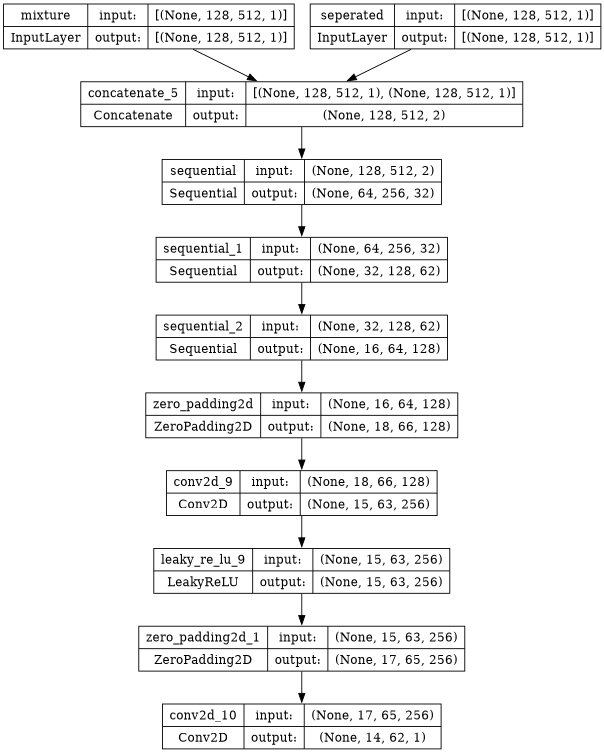

In [19]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [20]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [21]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + 100 * l1_loss 
    return total_gen_loss, gan_loss, l1_loss

In [22]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [23]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [24]:
@tf.function
def train_step(mixture, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(mixture, training=True)
        disc_real_output = disc([mixture, target], training=True)
        disc_generated_output = disc([mixture, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output,mixture, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss

In [25]:
@tf.function
def validation_step(mixture, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(mixture, training=False)
        disc_real_output = disc([mixture, target], training=False)
        disc_generated_output = disc([mixture, gen_output], training=False)
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output,mixture, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss,disc_real_loss, disc_generated_loss

In [26]:
each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses
    global each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses,train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_gan_losses, test_generator_l1_losses,test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global all_records, each_epoch_all_records
    
    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
#             each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
#             each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
#             each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
#             each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        # print("Training Details")
        # print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses)))
        # print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
#         train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
#         training_ssim.append(np.mean(each_epoch_train_ssim))
#         training_psnr.append(np.mean(each_epoch_train_psnr))
#         training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#             each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#             each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#             each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#             each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        # print("Validation Details")
        # print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses)))
        # print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        # print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
#         test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
#         testing_ssim.append(np.mean(each_epoch_test_ssim))
#         testing_psnr.append(np.mean(each_epoch_test_psnr))
#         testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
#         each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
#         each_epoch_test_psnr = []
#         each_epoch_test_lpips = []
#         each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
#         each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
#         each_epoch_train_ssim = []
#         each_epoch_train_psnr = []
#         each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
#         if epoch == 0 or epoch % 3 == 0:
#             # Function to display one random test image
#             # def display_random_test_image(images, labels, gen_model):
#             #     # Randomly select an index
#             #     random_test_image_idx = random.randint(0, len(images) - 1)

#             #     # Extract input and target from the selected index
#             #     random_test_input = images[random_test_image_idx]
#             #     random_test_target = labels[random_test_image_idx]

#             #     # Display the image
#             #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

#             # Example usage
#             display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000081.JPEG', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break


In [27]:
fit(train_dataset, 350, validation_dataset,gen)

Epoch 0


2024-12-09 17:36:50.708448: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1733765817.664952      68 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Number of iteration 5
Epoch 1
Number of iteration 5
Epoch 2
Number of iteration 5
Epoch 3


2024-12-09 17:37:51.342531: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 4
Number of iteration 5
Epoch 5
Number of iteration 5
Epoch 6
Number of iteration 5
Epoch 7
Number of iteration 5
Epoch 8
Number of iteration 5
Epoch 9


2024-12-09 17:38:53.750488: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 10
Number of iteration 5
Epoch 11
Number of iteration 5
Epoch 12
Number of iteration 5
Epoch 13
Number of iteration 5
Epoch 14
Number of iteration 5
Epoch 15


2024-12-09 17:39:56.009683: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Reduced generator learning rate to 0.0004500000213738531 at epoch 16
Epoch 16
Number of iteration 5
Epoch 17
Number of iteration 5
Epoch 18
Number of iteration 5
Epoch 19
Number of iteration 5
Epoch 20
Number of iteration 5
Epoch 21


2024-12-09 17:40:57.212464: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 22
Number of iteration 5
Epoch 23
Number of iteration 5
Epoch 24
Number of iteration 5
Epoch 25
Number of iteration 5
Epoch 26
Number of iteration 5
Epoch 27


2024-12-09 17:41:59.312655: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 28
Number of iteration 5
Epoch 29
Number of iteration 5
Epoch 30
Number of iteration 5
Epoch 31
Number of iteration 5
Epoch 32
Number of iteration 5
Epoch 33


2024-12-09 17:43:01.423090: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 34
Number of iteration 5
Epoch 35
Number of iteration 5
Epoch 36
Number of iteration 5
Epoch 37
Number of iteration 5
Epoch 38
Number of iteration 5
Epoch 39


2024-12-09 17:44:04.787563: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 40
Number of iteration 5
Epoch 41
Number of iteration 5
Epoch 42
Number of iteration 5
Epoch 43
Number of iteration 5
Epoch 44
Number of iteration 5
Epoch 45


2024-12-09 17:45:07.634027: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 46
Number of iteration 5
Epoch 47
Number of iteration 5
Epoch 48
Number of iteration 5
Epoch 49
Number of iteration 5
Epoch 50
Number of iteration 5
Epoch 51


2024-12-09 17:46:11.312362: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 52
Number of iteration 5
Epoch 53
Number of iteration 5
Epoch 54
Number of iteration 5
Epoch 55
Number of iteration 5
Epoch 56
Number of iteration 5
Epoch 57


2024-12-09 17:47:14.482147: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 58
Number of iteration 5
Epoch 59
Number of iteration 5
Epoch 60
Number of iteration 5
Epoch 61
Number of iteration 5
Epoch 62
Number of iteration 5
Epoch 63


2024-12-09 17:48:16.494557: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 64
Number of iteration 5
Epoch 65
Number of iteration 5
Epoch 66
Number of iteration 5
Epoch 67
Number of iteration 5
Epoch 68
Number of iteration 5
Epoch 69


2024-12-09 17:49:20.517514: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 70
Number of iteration 5
Epoch 71
Number of iteration 5
Epoch 72
Number of iteration 5
Epoch 73
Number of iteration 5
Epoch 74
Number of iteration 5
Epoch 75


2024-12-09 17:50:23.011393: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 76
Number of iteration 5
Epoch 77
Number of iteration 5
Epoch 78
Number of iteration 5
Epoch 79
Number of iteration 5
Epoch 80
Number of iteration 5
Epoch 81


2024-12-09 17:51:25.544266: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 82
Number of iteration 5
Epoch 83
Number of iteration 5
Epoch 84
Number of iteration 5
Epoch 85
Number of iteration 5
Epoch 86
Number of iteration 5
Epoch 87


2024-12-09 17:52:29.841876: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 88
Number of iteration 5
Epoch 89
Number of iteration 5
Epoch 90
Number of iteration 5
Epoch 91
Number of iteration 5
Epoch 92
Number of iteration 5
Epoch 93


2024-12-09 17:53:32.652450: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 94
Number of iteration 5
Epoch 95
Number of iteration 5
Epoch 96
Number of iteration 5
Epoch 97
Number of iteration 5
Epoch 98
Number of iteration 5
Epoch 99


2024-12-09 17:54:35.890464: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 100
Number of iteration 5
Epoch 101
Number of iteration 5
Epoch 102
Number of iteration 5
Epoch 103
Number of iteration 5
Epoch 104
Number of iteration 5
Epoch 105


2024-12-09 17:55:39.017896: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 106
Number of iteration 5
Epoch 107
Number of iteration 5
Epoch 108
Number of iteration 5
Epoch 109
Number of iteration 5
Epoch 110
Number of iteration 5
Epoch 111


2024-12-09 17:56:39.242058: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 112
Number of iteration 5
Epoch 113
Number of iteration 5
Epoch 114
Number of iteration 5
Epoch 115
Number of iteration 5
Epoch 116
Number of iteration 5
Epoch 117


2024-12-09 17:57:42.777173: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 118
Number of iteration 5
Epoch 119
Number of iteration 5
Epoch 120
Number of iteration 5
Epoch 121
Number of iteration 5
Epoch 122
Number of iteration 5
Epoch 123


2024-12-09 17:58:46.578471: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 124
Number of iteration 5
Epoch 125
Number of iteration 5
Epoch 126
Number of iteration 5
Epoch 127
Number of iteration 5
Epoch 128
Number of iteration 5
Epoch 129


2024-12-09 17:59:48.835512: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 130
Number of iteration 5
Epoch 131
Number of iteration 5
Epoch 132
Number of iteration 5
Epoch 133
Number of iteration 5
Epoch 134
Number of iteration 5
Epoch 135


2024-12-09 18:00:51.671001: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 136
Number of iteration 5
Epoch 137
Number of iteration 5
Epoch 138
Number of iteration 5
Epoch 139
Number of iteration 5
Epoch 140
Number of iteration 5
Epoch 141


2024-12-09 18:01:55.594951: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 142
Number of iteration 5
Epoch 143
Number of iteration 5
Epoch 144
Number of iteration 5
Epoch 145
Number of iteration 5
Epoch 146
Number of iteration 5
Epoch 147


2024-12-09 18:02:57.906803: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 148
Number of iteration 5
Epoch 149
Number of iteration 5
Epoch 150
Number of iteration 5
Epoch 151
Number of iteration 5
Epoch 152
Number of iteration 5
Epoch 153


2024-12-09 18:04:00.104091: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 154
Number of iteration 5
Epoch 155
Number of iteration 5
Epoch 156
Number of iteration 5
Epoch 157
Number of iteration 5
Epoch 158
Number of iteration 5
Epoch 159


2024-12-09 18:05:03.120567: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 160
Number of iteration 5
Epoch 161
Number of iteration 5
Epoch 162
Number of iteration 5
Epoch 163
Number of iteration 5
Epoch 164
Number of iteration 5
Epoch 165


2024-12-09 18:06:05.991880: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 166
Number of iteration 5
Epoch 167
Number of iteration 5
Epoch 168
Number of iteration 5
Epoch 169
Number of iteration 5
Epoch 170
Number of iteration 5
Epoch 171


2024-12-09 18:07:08.317661: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 172
Number of iteration 5
Epoch 173
Number of iteration 5
Epoch 174
Number of iteration 5
Epoch 175
Number of iteration 5
Epoch 176
Number of iteration 5
Epoch 177


2024-12-09 18:08:14.410495: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 178
Number of iteration 5
Epoch 179
Number of iteration 5
Epoch 180
Number of iteration 5
Epoch 181
Number of iteration 5
Epoch 182
Number of iteration 5
Epoch 183


2024-12-09 18:09:16.860931: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 184
Number of iteration 5
Epoch 185
Number of iteration 5
Epoch 186
Number of iteration 5
Epoch 187
Number of iteration 5
Epoch 188
Number of iteration 5
Epoch 189


2024-12-09 18:10:19.259008: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 190
Number of iteration 5
Epoch 191
Number of iteration 5
Epoch 192
Number of iteration 5
Epoch 193
Number of iteration 5
Epoch 194
Number of iteration 5
Epoch 195


2024-12-09 18:11:21.625226: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 196
Number of iteration 5
Epoch 197
Number of iteration 5
Epoch 198
Number of iteration 5
Epoch 199
Number of iteration 5
Epoch 200
Number of iteration 5
Epoch 201


2024-12-09 18:12:23.906029: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 202
Number of iteration 5
Epoch 203
Number of iteration 5
Epoch 204
Number of iteration 5
Epoch 205
Number of iteration 5
Epoch 206
Number of iteration 5
Epoch 207


2024-12-09 18:13:26.655250: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 208
Number of iteration 5
Epoch 209
Number of iteration 5
Epoch 210
Number of iteration 5
Epoch 211
Number of iteration 5
Epoch 212
Number of iteration 5
Epoch 213


2024-12-09 18:14:29.200606: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 214
Number of iteration 5
Epoch 215
Number of iteration 5
Epoch 216
Number of iteration 5
Epoch 217
Number of iteration 5
Epoch 218
Number of iteration 5
Epoch 219


2024-12-09 18:15:34.517513: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 220
Number of iteration 5
Epoch 221
Number of iteration 5
Epoch 222
Number of iteration 5
Epoch 223
Number of iteration 5
Epoch 224
Number of iteration 5
Epoch 225


2024-12-09 18:16:37.113699: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 226
Number of iteration 5
Epoch 227
Number of iteration 5
Epoch 228
Number of iteration 5
Epoch 229
Number of iteration 5
Epoch 230
Number of iteration 5
Epoch 231


2024-12-09 18:17:39.680852: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 232
Number of iteration 5
Epoch 233
Number of iteration 5
Epoch 234
Number of iteration 5
Epoch 235
Number of iteration 5
Epoch 236
Number of iteration 5
Epoch 237


2024-12-09 18:18:42.094422: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 238
Number of iteration 5
Epoch 239
Number of iteration 5
Epoch 240
Number of iteration 5
Epoch 241
Number of iteration 5
Epoch 242
Number of iteration 5
Epoch 243


2024-12-09 18:19:44.283677: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 244
Number of iteration 5
Epoch 245
Number of iteration 5
Epoch 246
Number of iteration 5
Epoch 247
Number of iteration 5
Epoch 248
Number of iteration 5
Epoch 249


2024-12-09 18:20:47.453501: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 250
Number of iteration 5
Epoch 251
Number of iteration 5
Epoch 252
Number of iteration 5
Epoch 253
Number of iteration 5
Epoch 254
Number of iteration 5
Epoch 255


2024-12-09 18:21:50.331747: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 256
Number of iteration 5
Epoch 257
Number of iteration 5
Epoch 258
Number of iteration 5
Epoch 259
Number of iteration 5
Epoch 260
Number of iteration 5
Epoch 261


2024-12-09 18:22:53.165131: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 262
Number of iteration 5
Epoch 263
Number of iteration 5
Epoch 264
Number of iteration 5
Epoch 265
Number of iteration 5
Epoch 266
Number of iteration 5
Epoch 267


2024-12-09 18:23:56.012120: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 268
Number of iteration 5
Epoch 269
Number of iteration 5
Epoch 270
Number of iteration 5
Epoch 271
Number of iteration 5
Epoch 272


2024-12-09 18:24:56.802084: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 273
Number of iteration 5
Epoch 274
Number of iteration 5
Epoch 275
Number of iteration 5
Epoch 276
Number of iteration 5
Epoch 277
Number of iteration 5
Epoch 278


2024-12-09 18:26:00.591607: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 279
Number of iteration 5
Epoch 280
Number of iteration 5
Epoch 281
Number of iteration 5
Epoch 282
Number of iteration 5
Epoch 283
Number of iteration 5
Epoch 284


2024-12-09 18:27:03.881888: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 285
Number of iteration 5
Epoch 286
Number of iteration 5
Epoch 287
Number of iteration 5
Epoch 288
Number of iteration 5
Epoch 289
Number of iteration 5
Epoch 290


2024-12-09 18:28:07.237339: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 291
Number of iteration 5
Epoch 292
Number of iteration 5
Epoch 293
Number of iteration 5
Epoch 294
Number of iteration 5
Epoch 295
Number of iteration 5
Epoch 296


2024-12-09 18:29:10.927470: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 297
Number of iteration 5
Epoch 298
Number of iteration 5
Epoch 299
Number of iteration 5
Epoch 300
Number of iteration 5
Epoch 301
Number of iteration 5
Epoch 302


2024-12-09 18:30:13.820178: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 303
Number of iteration 5
Epoch 304
Number of iteration 5
Epoch 305
Number of iteration 5
Epoch 306
Number of iteration 5
Epoch 307
Number of iteration 5
Epoch 308


2024-12-09 18:31:17.346733: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 309
Number of iteration 5
Epoch 310
Number of iteration 5
Epoch 311
Number of iteration 5
Epoch 312
Number of iteration 5
Epoch 313
Number of iteration 5
Epoch 314


2024-12-09 18:32:20.718771: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 315
Number of iteration 5
Epoch 316
Number of iteration 5
Epoch 317
Number of iteration 5
Epoch 318
Number of iteration 5
Epoch 319
Number of iteration 5
Epoch 320


2024-12-09 18:33:24.470497: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 321
Number of iteration 5
Epoch 322
Number of iteration 5
Epoch 323
Number of iteration 5
Epoch 324
Number of iteration 5
Epoch 325
Number of iteration 5
Epoch 326


2024-12-09 18:34:27.951549: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 327
Number of iteration 5
Epoch 328
Number of iteration 5
Epoch 329
Number of iteration 5
Epoch 330
Number of iteration 5
Epoch 331
Number of iteration 5
Epoch 332


2024-12-09 18:35:30.308865: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 333
Number of iteration 5
Epoch 334
Number of iteration 5
Epoch 335
Number of iteration 5
Epoch 336
Number of iteration 5
Epoch 337
Number of iteration 5
Epoch 338


2024-12-09 18:36:33.484589: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 339
Number of iteration 5
Epoch 340
Number of iteration 5
Epoch 341
Number of iteration 5
Epoch 342
Number of iteration 5
Epoch 343
Number of iteration 5
Epoch 344


2024-12-09 18:37:37.259303: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Number of iteration 5
Epoch 345
Number of iteration 5
Epoch 346
Number of iteration 5
Epoch 347
Number of iteration 5
Epoch 348
Number of iteration 5
Epoch 349
Number of iteration 5


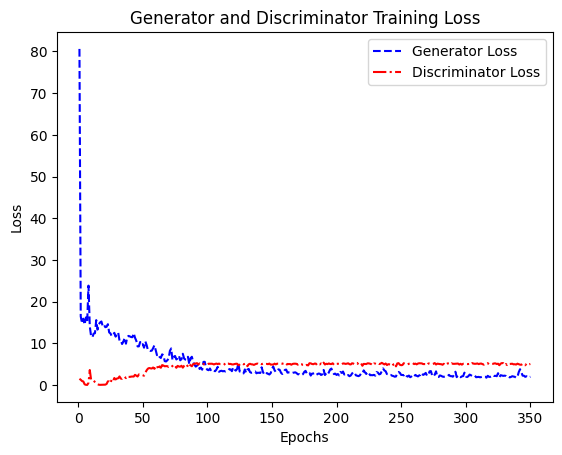

In [28]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

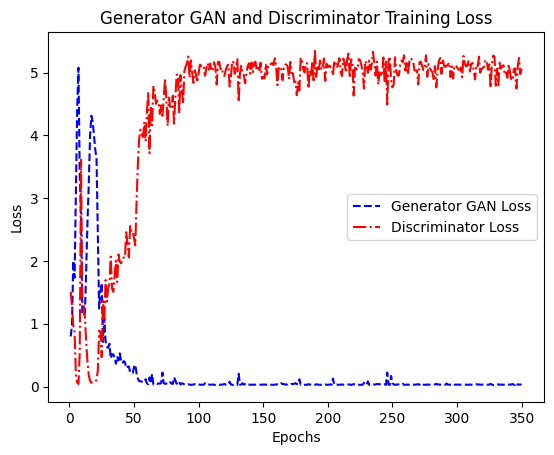

In [29]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator GAN and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

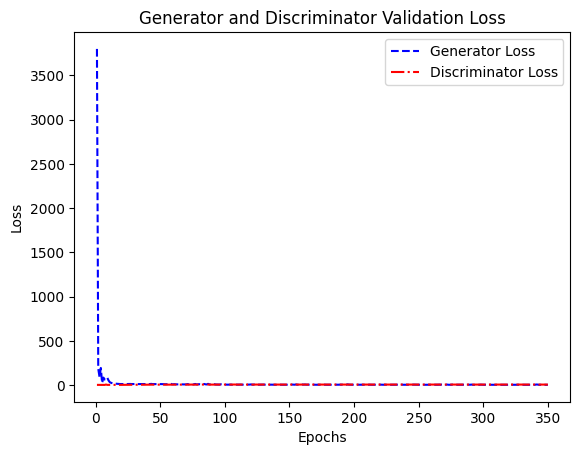

In [30]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

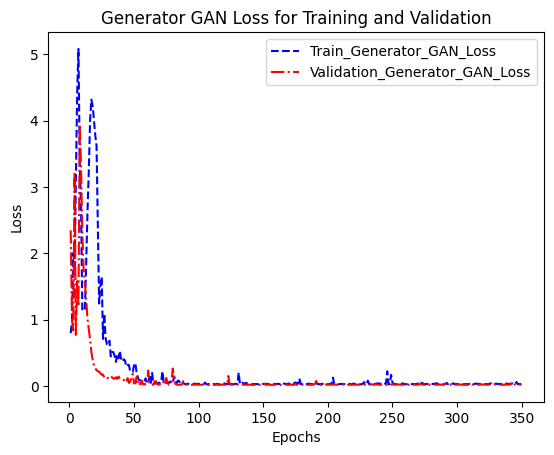

In [31]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

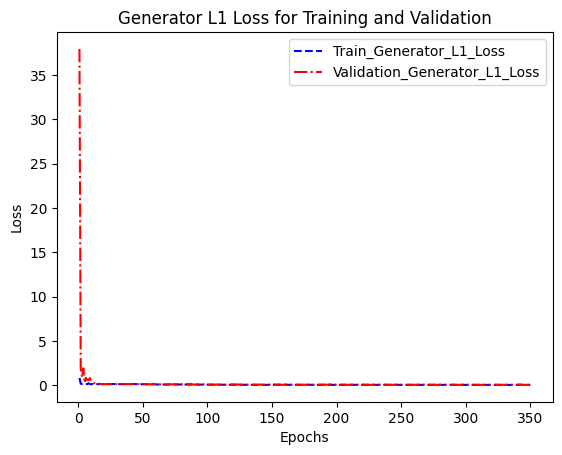

In [32]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

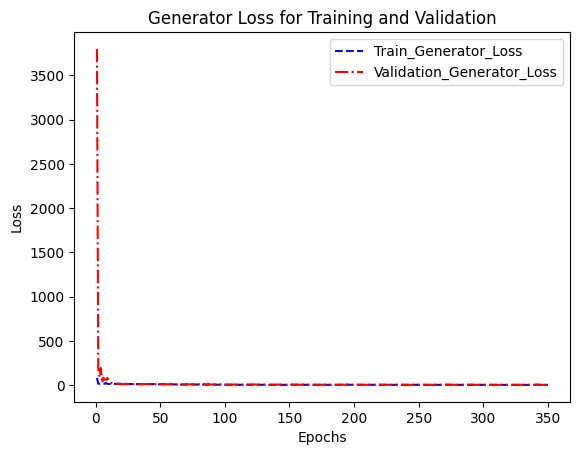

In [33]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

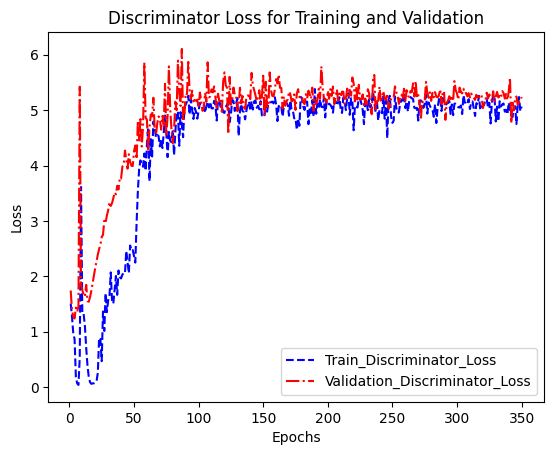

In [34]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

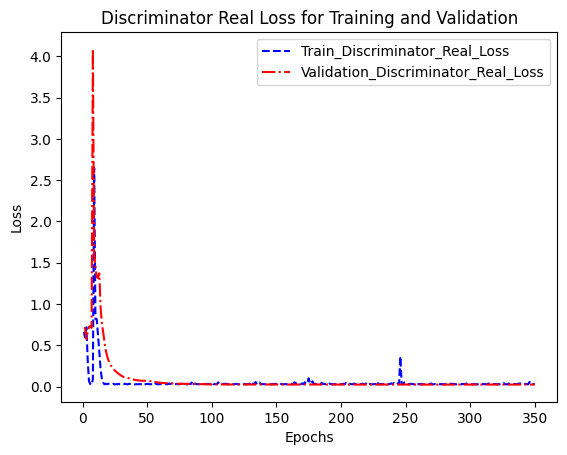

In [35]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

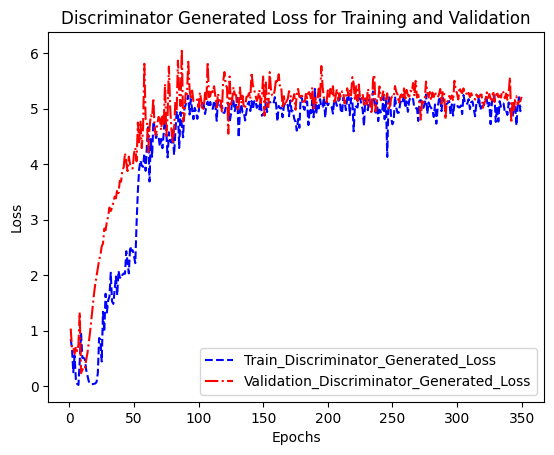

In [36]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [37]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [38]:
os.mkdir('/kaggle/working/modelsFeb20')

In [39]:
gen.save('/kaggle/working/modelsFeb20/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb20/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb20/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb20/disc_weight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/opt/conda/lib/python3.10/site-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


In [40]:
number_of_chunks = mixture_spectogram.shape[0]//128
target = np.zeros([mixture_spectogram.shape[0],512])
for i in range(number_of_chunks):
    START = i*128
    END = START + 128

    S_mix_new=mixture_spectogram[START:END, :]

    X=tf.reshape(S_mix_new, (1, 128, 512, 1))

    y=gen.predict(X, batch_size=32)
    target[START:END,:] = y.reshape(128,512)
S_mix_new=mixture_spectogram[-128:, :]
X=tf.reshape(S_mix_new,(1, 128, 512, 1))
y=gen.predict(X, batch_size=32)
target[-128:,:] = y.reshape(128,512)

1/1 [==============================] - 0s 17ms/step


In [41]:
y = tfio.audio.inverse_spectrogram(target.astype(np.float32),nfft=1022, window=1022, stride=512)

In [42]:
Audio(y,rate=44100)